In [1]:
import pandas as pd
import matplotlib as mpl
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

original="Customer-Churn-Records.csv"
df=pd.read_csv(original,sep=',')
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1,2,DIAMOND,464
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1,3,DIAMOND,456
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1,3,DIAMOND,377
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0,5,GOLD,350
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,0,5,GOLD,425


In [2]:
#Every bank wants to hold there customers for sustaining their business and thus this Anonymous Multinational bank.
#Below is the customer data of account holders at Anonymous Multinational Bank and the aim of the data will be predicting the Customer Churn.


#Data information

#RowNumber—corresponds to the record (row) number and has no effect on the output.
#CustomerId—contains random values and has no effect on customer leaving the bank.
#Surname—the surname of a customer has no impact on their decision to leave the bank.
#CreditScore—can have an effect on customer churn, since a customer with a higher credit score is less likely to leave the bank.
#Geography—a customer’s location can affect their decision to leave the bank.
#Gender—it’s interesting to explore whether gender plays a role in a customer leaving the bank.
#Age—this is certainly relevant, since older customers are less likely to leave their bank than younger ones.
#Tenure—refers to the number of years that the customer has been a client of the bank. Normally, older clients are more loyal and less likely to leave a bank.
#Balance—also a very good indicator of customer churn, as people with a higher balance in their accounts are less likely to leave the bank compared to those with lower balances.
#NumOfProducts—refers to the number of products that a customer has purchased through the bank.
#HasCrCard—denotes whether or not a customer has a credit card. This column is also relevant, since people with a credit card are less likely to leave the bank.
#IsActiveMember—active customers are less likely to leave the bank.
#EstimatedSalary—as with balance, people with lower salaries are more likely to leave the bank compared to those with higher salaries.
#Exited—whether or not the customer left the bank.
#Complain—customer has complaint or not.
#Satisfaction Score—Score provided by the customer for their complaint resolution.
#Card Type—type of card hold by the customer.
#Points Earned—the points earned by the customer for using credit card.


#Cada banco desea retener a sus clientes para mantener su negocio y esto se aplica al Banco Multinacional Anónimo.

#A continuación se encuentra la información de los clientes que tienen cuentas en el Banco Multinacional Anónimo, y el objetivo de estos
#datos es predecir la Fuga de Clientes (Customer Churn).

#RowNumber: corresponde al número de registro (fila) y no tiene efecto en la salida.
#CustomerId: contiene valores aleatorios y no tiene efecto en que el cliente abandone el banco.
#Surname: el apellido de un cliente no tiene impacto en su decisión de abandonar el banco.
#CreditScore: puede tener un efecto en la rotación de clientes, ya que un cliente con un puntaje de crédito más alto es menos probable que abandone el banco.
#Geography: la ubicación de un cliente puede afectar su decisión de abandonar el banco.
#Gender: es interesante explorar si el género juega un papel en que un cliente abandone el banco.
#Age: esto es ciertamente relevante, ya que los clientes mayores son menos propensos a abandonar su banco que los más jóvenes.
#Tenure: se refiere al número de años que el cliente ha sido cliente del banco. Normalmente, los clientes más antiguos son más leales y menos propensos a abandonar un banco.
#Balance: también es un indicador muy bueno de la rotación de clientes, ya que las personas con un saldo más alto en sus cuentas son menos propensas a abandonar el banco en comparación con aquellas con saldos más bajos.
#NumOfProducts: se refiere al número de productos que un cliente ha comprado a través del banco.
#HasCrCard: indica si un cliente tiene una tarjeta de crédito. Esta columna también es relevante, ya que las personas con una tarjeta de crédito son menos propensas a abandonar el banco.
#IsActiveMember: los clientes activos son menos propensos a abandonar el banco.
#EstimatedSalary: al igual que el saldo, las personas con salarios más bajos son más propensas a abandonar el banco en comparación con aquellas con salarios más altos.
#Exited: si el cliente abandonó o no el banco.
#Complain: si el cliente presentó una queja o no.
#Satisfaction Score: Puntuación proporcionada por el cliente para la resolución de su queja.
#Card Type: tipo de tarjeta que posee el cliente.
#Points Earned: los puntos ganados por el cliente por el uso de la tarjeta de crédito.

##Data exploration/Exploración de datos

#As we can see, the columns Rownumber, CustomerId, and Surname are not relevant when building the model to determine whether a customer
#will stay or leave the bank. The variable of interest in this case is the "Exited" variable, which indicates whether the customer churned from the bank or not.

#Como podemos ver las columnas Rownumber, Customer Id y Surname no tienen relevancia a  la hora de realizar el modelo para determinar si un
#cliente permanecerá o no en el banco. La variable y o variable categórica de interés en este caso es la variable "Exited" la cual nos dice
#si el cliente abandonó el banco o no

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   RowNumber           10000 non-null  int64  
 1   CustomerId          10000 non-null  int64  
 2   Surname             10000 non-null  object 
 3   CreditScore         10000 non-null  int64  
 4   Geography           10000 non-null  object 
 5   Gender              10000 non-null  object 
 6   Age                 10000 non-null  int64  
 7   Tenure              10000 non-null  int64  
 8   Balance             10000 non-null  float64
 9   NumOfProducts       10000 non-null  int64  
 10  HasCrCard           10000 non-null  int64  
 11  IsActiveMember      10000 non-null  int64  
 12  EstimatedSalary     10000 non-null  float64
 13  Exited              10000 non-null  int64  
 14  Complain            10000 non-null  int64  
 15  Satisfaction Score  10000 non-null  int64  
 16  Card 

In [3]:
#Verifying that the output variable only has two categories.
#Checamos que la salida y solamente tenga dos categorías
df['Exited'].unique()

array([1, 0], dtype=int64)

In [4]:
#There's no need to transform the categories, as we have binary values 1, 0 where 1 indicates that the customer churned and 0 indicates
#that the customer stayed with the bank.
#No hay necesidad de transformar las catergorías, ya que tenemos valores binarios 1,0 donde 1 es que el cliente abandonó y 0 es que el cliente
#permaneció en el banco


In [5]:
#Before removing unnecessary columns for the model, we must check that all customer IDs are unique to avoid having duplicate information.
#Antes de eliminar las columnas innecesarias para el modelo, debemos checar que todos los ID de los clientes sean únicos para evitar tener
#información duplicada
df.nunique().sort_values(ascending=False) #This method calculates the number of unique values for each column in the DataFrame.


RowNumber             10000
CustomerId            10000
EstimatedSalary        9999
Balance                6382
Surname                2932
Point Earned            785
CreditScore             460
Age                      70
Tenure                   11
Satisfaction Score        5
Card Type                 4
NumOfProducts             4
Geography                 3
Gender                    2
HasCrCard                 2
IsActiveMember            2
Exited                    2
Complain                  2
dtype: int64

In [6]:

#As we can see, CustomerId doesn't have duplicate values. We can check some of the unique values in the columns to become
#more familiar with the concepts.

#Como podemos ver CustomerId no tiene valores duplicados, podemos verificar algunos de los valores únicos de las columnas para estar
#mas familiarizados con los conceptos

columnas_seleccionadas = ['Satisfaction Score', 'Card Type', 'NumOfProducts','Geography','Gender','HasCrCard','IsActiveMember','Complain']

for columna in columnas_seleccionadas:
    valores_unicos = df[columna].unique()
    print(f"Valores únicos en la columna '{columna}': {valores_unicos}")

Valores únicos en la columna 'Satisfaction Score': [2 3 5 4 1]
Valores únicos en la columna 'Card Type': ['DIAMOND' 'GOLD' 'SILVER' 'PLATINUM']
Valores únicos en la columna 'NumOfProducts': [1 3 2 4]
Valores únicos en la columna 'Geography': ['France' 'Spain' 'Germany']
Valores únicos en la columna 'Gender': ['Female' 'Male']
Valores únicos en la columna 'HasCrCard': [1 0]
Valores únicos en la columna 'IsActiveMember': [1 0]
Valores únicos en la columna 'Complain': [1 0]


In [7]:
#As we can observe, we have categorical variables with text strings that will need to be converted into numerical data later on.
#Como podemos observar tenemos variables categoricas con cadenas de texto que será necesario convertir a datos númericos más adelante

In [8]:
#We proceed to remove the unnecessary columns.
#Procedemos a eliminar las columnas innesarias
del df['RowNumber']
del df['CustomerId']
del df['Surname']


df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Complain,Satisfaction Score,Card Type,Point Earned
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,1,2,DIAMOND,464
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,1,3,DIAMOND,456
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,1,3,DIAMOND,377
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,0,5,GOLD,350
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,0,5,GOLD,425


In [9]:
#Checking for any null values in our dataset.
#Checar si hay valores nulos en nuestro dataset
df.isnull().sum()


CreditScore           0
Geography             0
Gender                0
Age                   0
Tenure                0
Balance               0
NumOfProducts         0
HasCrCard             0
IsActiveMember        0
EstimatedSalary       0
Exited                0
Complain              0
Satisfaction Score    0
Card Type             0
Point Earned          0
dtype: int64

<AxesSubplot:>

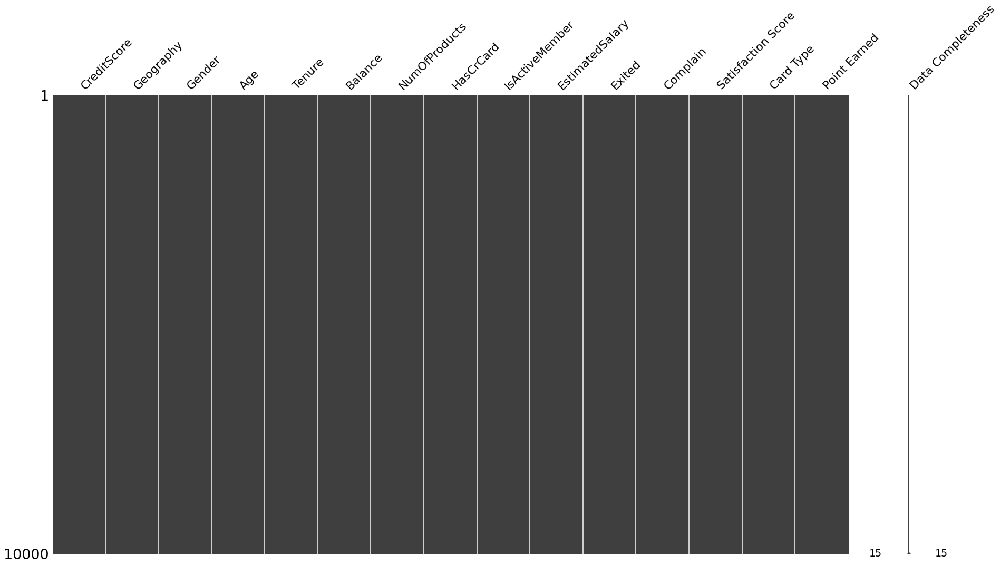

In [10]:
#We can also check for the absence of null values in matrix form.
#También podemos checar que no haya valores nulos en forma de matriz
import missingno as msno

msno.matrix(df,labels=[df.columns],figsize=(30,16),fontsize=22)


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CreditScore         10000 non-null  int64  
 1   Geography           10000 non-null  object 
 2   Gender              10000 non-null  object 
 3   Age                 10000 non-null  int64  
 4   Tenure              10000 non-null  int64  
 5   Balance             10000 non-null  float64
 6   NumOfProducts       10000 non-null  int64  
 7   HasCrCard           10000 non-null  int64  
 8   IsActiveMember      10000 non-null  int64  
 9   EstimatedSalary     10000 non-null  float64
 10  Exited              10000 non-null  int64  
 11  Complain            10000 non-null  int64  
 12  Satisfaction Score  10000 non-null  int64  
 13  Card Type           10000 non-null  object 
 14  Point Earned        10000 non-null  int64  
dtypes: float64(2), int64(10), object(3)
memory usage: 1.1+

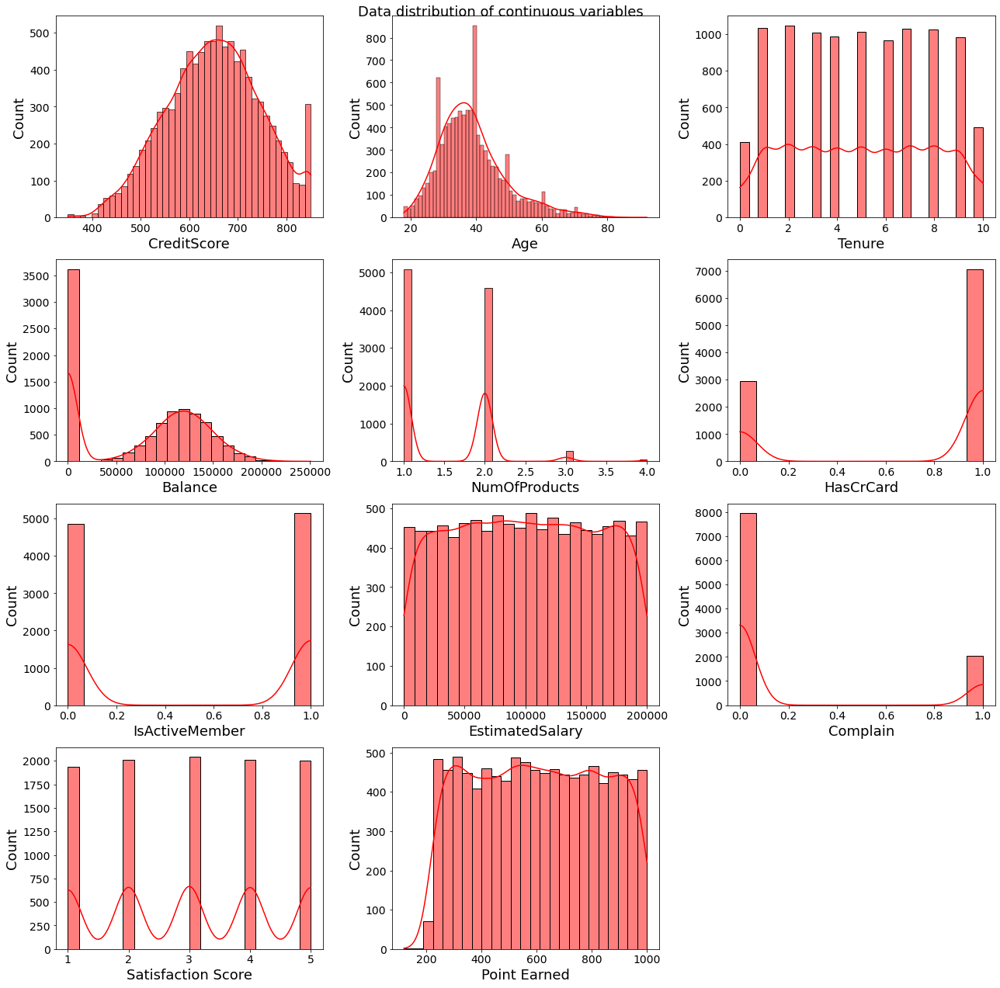

In [12]:
# As we could see in the data types, we have 10 columns of numerical type.
# Como pudimos ver en el tipo de datos del df reducido, tenemos 10 columnas de tipo numérico.

# In this step, we are checking the distribution of each variable that is continuous.
# En este paso, estamos verificando la distribución de cada variable que es continua.

plt.figure(figsize=(18, 18))
for i, col in enumerate(df.drop(['Exited'], axis=1).select_dtypes(include=['int','float']).columns):
    # We exclude the 'y' column and only consider the columns of numerical type.
    # Excluimos la columna 'y' y solo consideramos las columnas de tipo numérico.

    plt.rcParams['axes.facecolor'] = 'white'
    ax = plt.subplot(4, 3, i+1)  # Creating a subplot for each column.
    # Creamos una subfigura para cada columna.

     # Plotting the histogram for each column
    sns.histplot(data=df, x=col, ax=ax, color='red', kde=True)

    # Plotting the KDE curve with custom color and linewidth
    # Plotting the histogram for each column.
    # Graficamos el histograma para cada columna.
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)
    ax.set_xlabel(col, fontsize=18)
    ax.set_ylabel('Count', fontsize=18)
    
plt.suptitle('Data distribution of continuous variables',fontsize=18)
plt.tight_layout()


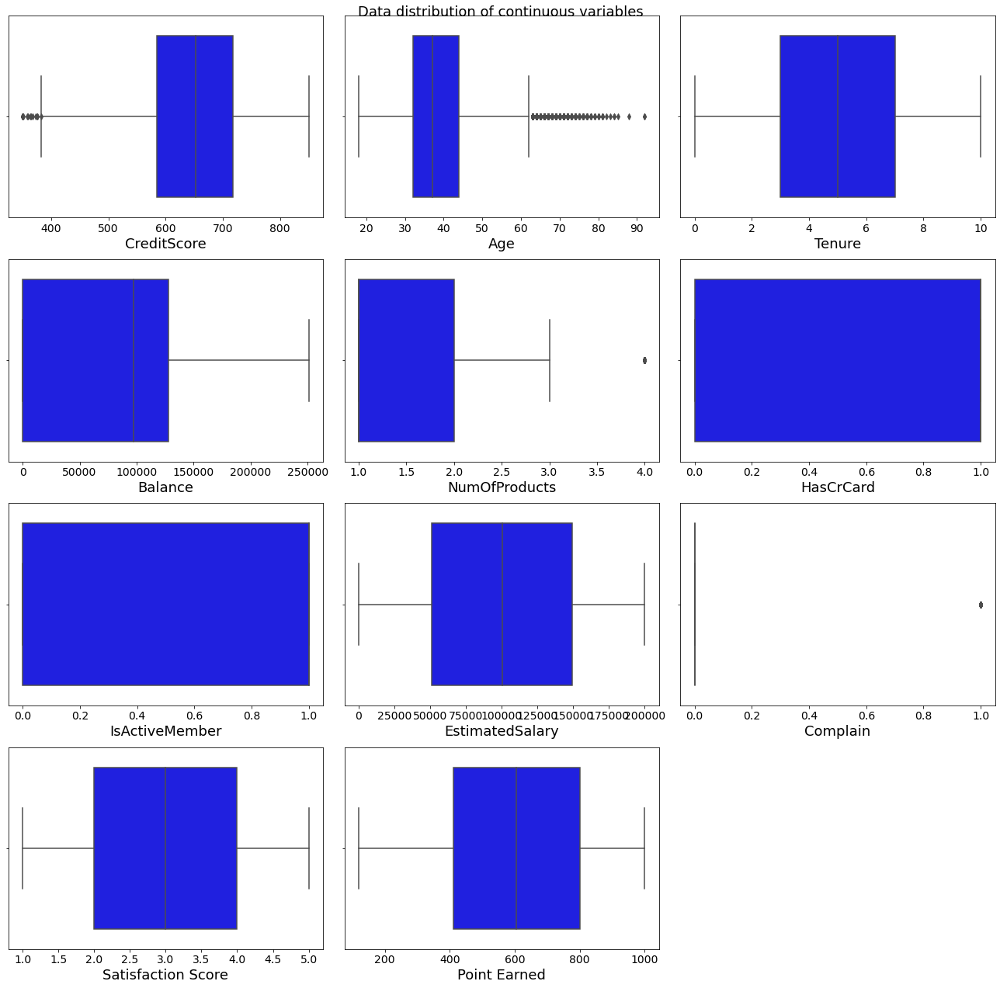

In [13]:
# We can also visualize the data distribution using box plots for each continuous variable.
# También podemos visualizar la distribución de los datos usando gráficos de caja (box plots) para cada variable continua.

plt.figure(figsize=(18, 18))
for i, col in enumerate(df.drop(['Exited'], axis=1).select_dtypes(include=['int', 'float']).columns):
    plt.rcParams['axes.facecolor'] = 'white'
    ax = plt.subplot(4, 3, i+1)
    sns.boxplot(data=df, x=col, ax=ax, color='blue')
    ax.tick_params(axis='x', labelsize=14)
    ax.set_xlabel(col, fontsize=18)

plt.suptitle('Data distribution of continuous variables',fontsize=18)
plt.tight_layout()


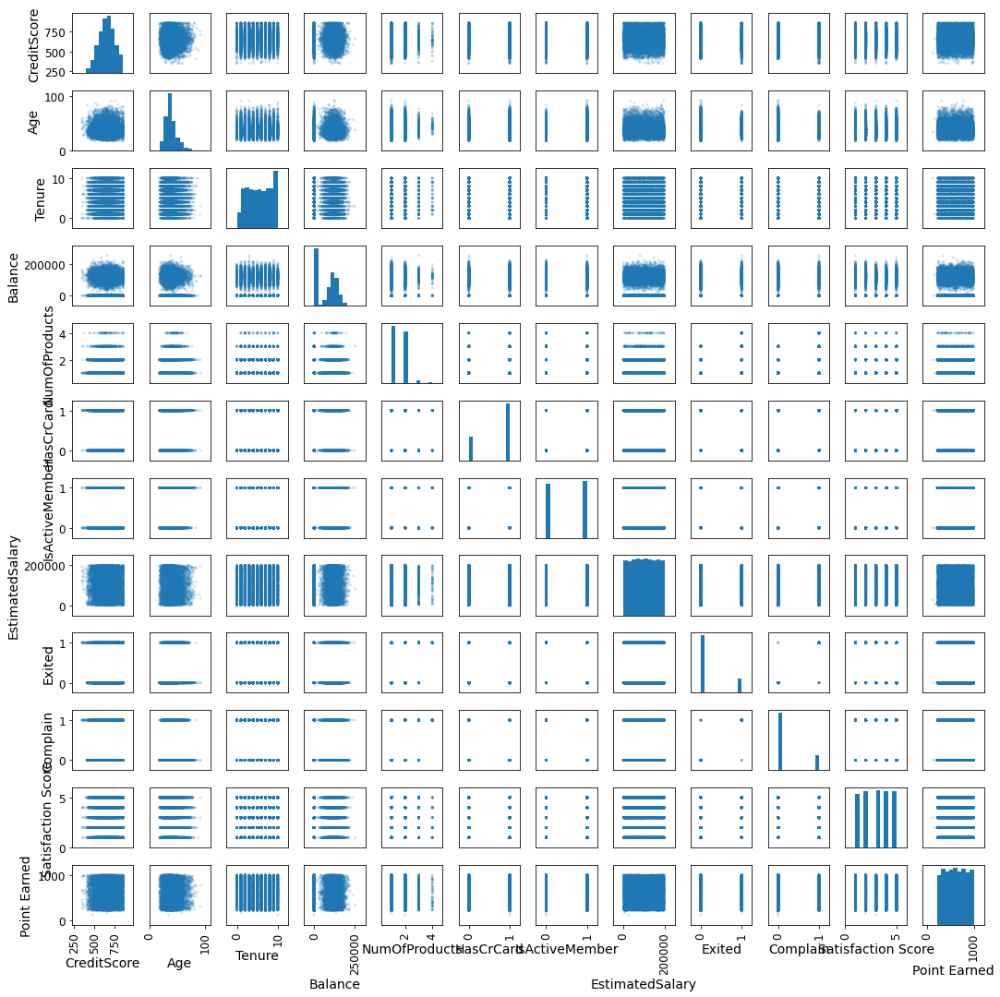

In [14]:
#We can visually observe if there is any correlation among the numerical variables.
#Podemos observar gráficamente si existe alguna correlación entre alguna de las variables númericas
import pandas as pd
# Get only the numeric columns from the DataFrame
# Obtener solo las columnas numéricas del DataFrame
num_columns = df.select_dtypes(include=['int64', 'float64'])

# Create the scatter matrix using pandas.plotting.scatter_matrix
# Crear la matriz de dispersión utilizando pandas.plotting.scatter_matrix
scatter_matrix = pd.plotting.scatter_matrix(num_columns, alpha=0.2,
                                            grid=False, diagonal='hist', marker='.',
                                            range_padding=0.5, figsize=(15, 15))


# Adjust axis labels to avoid overlap and change label size
for ax in scatter_matrix.flatten():
    ax.tick_params(axis='both', labelsize=12)
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)

# Adjust axis labels to avoid overlap
# Ajustar las etiquetas de los ejes para evitar la superposición
plt.tight_layout()

# Show the scatter matrix
# Mostrar la matriz de dispersión
plt.show()


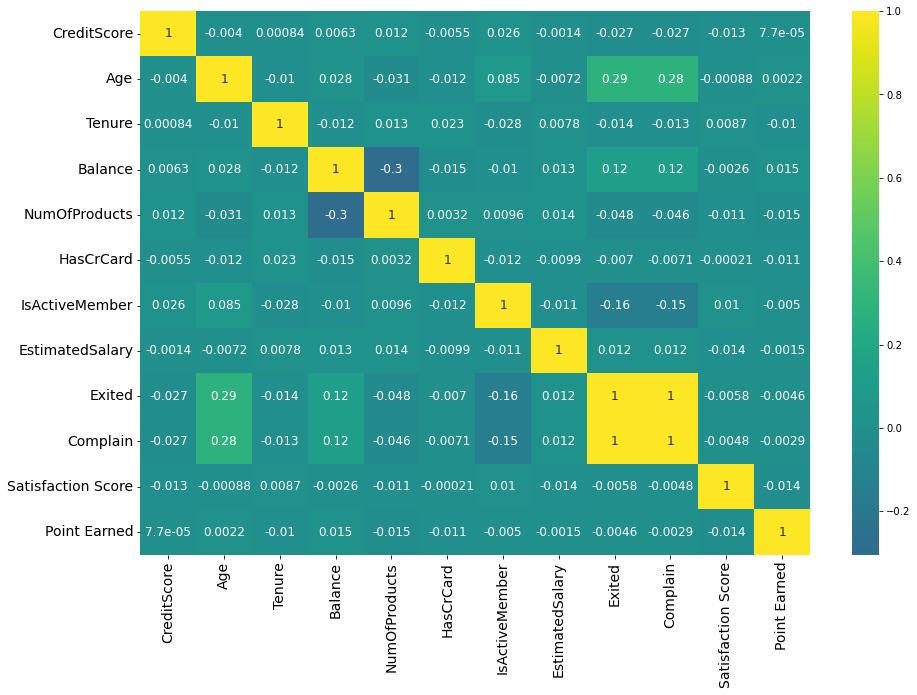

In [15]:
# We can visualize the correlations between variables using a correlation matrix heatmap
# Podemos visualizar las correlaciones entre variables utilizando una matriz de correlación (heatmap)
plt.figure(figsize=(15, 10))
sns.heatmap(df.select_dtypes(include=['int', 'float']).corr(), annot=True, center=0,cmap='viridis',annot_kws={'size': 12})
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()


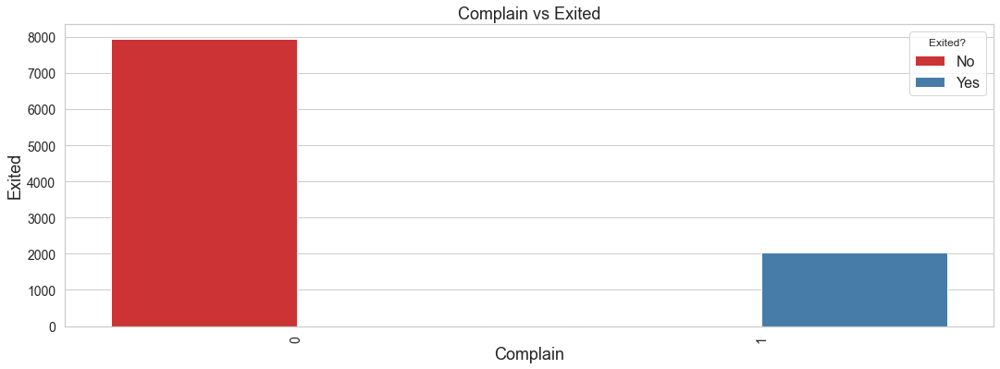

In [16]:
#We can observe that there is a perfect correlation between people who lodged complaints and those who churned from the bank.
#Podemos observar que hay una correlación perfecta entre las personas que se quejaron y los que abandonaron el banco
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="Complain", data=df,hue='Exited')
plt.xlabel("Complain",fontsize=18)
plt.ylabel("Exited",fontsize=18)
plt.title("Complain vs Exited",fontsize=18)
plt.legend(title="Exited?", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [17]:

import pandas as pd

# Extract the columns of interest
# Extraer las columnas de interés
columna1 = df['Complain']
columna2 = df['Exited']

# Calculate the values of a, b, and c
# Calcular los valores de a, b y c
a = sum((columna1 == 1) & (columna2 == 1))
b = sum((columna1 == 1) & (columna2 == 0))
c = sum((columna1 == 0) & (columna2 == 1))

# Calculate the adjusted Jaccard coefficient
# Calcular el coeficiente de Jaccard ajustado
adjusted_jaccard = a / (a + b + c)
print(f"Adjusted Jaccard Coefficient: {adjusted_jaccard:.4f}")


Adjusted Jaccard Coefficient: 0.9932


In [18]:
#As we can see, there is a very strong correlation between people who lodged complaints and those who left the bank.
#We need to remove this variable as it is very similar to our output variable.

#Como podemos observar hay  una coincidencia muy grande entre las personas que se quejaron y los que salieron del banco.
#Tenemos que eliminar esta variable ya que es muy parecida a nuestra variable de salida
df = df.drop('Complain', axis = 1)
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction Score,Card Type,Point Earned
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,2,DIAMOND,464
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,3,DIAMOND,456
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,3,DIAMOND,377
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,5,GOLD,350
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,5,GOLD,425


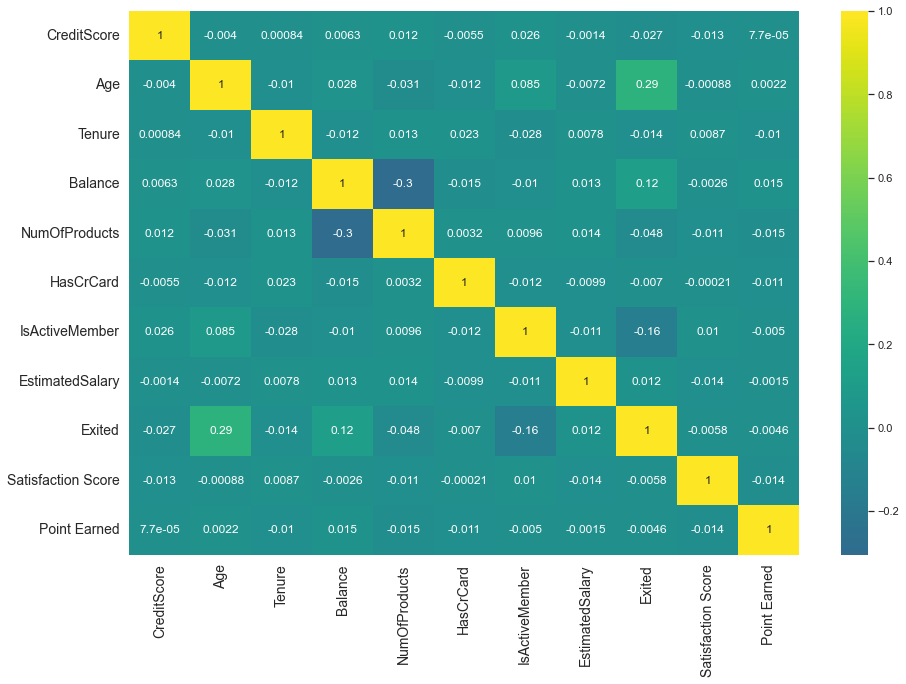

In [19]:
# We can visualize the correlations between variables using a correlation matrix heatmap
# Podemos visualizar las correlaciones entre variables utilizando una matriz de correlación (heatmap)
plt.figure(figsize=(15, 10))
sns.heatmap(df.select_dtypes(include=['int', 'float']).corr(), annot=True, center=0,cmap='viridis',annot_kws={'size': 12})
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()


In [20]:
#As we can see, there aren't other variables with such a strong correlation.
#We can proceed to observe the behavior of the other variables with customer retention.
#Credit Score is a variable with a wide range, so we can observe its behavior by ranges.

#Como podemos ver no hay algunas otras variables que tengan correlación tan fuerte
#Podemos proceder a observar el comportamiento de las demás variables con la permanencia o no del cliente
#Credit Score es una variable que tiene un rango muy grande, por lo que podemos observar su comportamiento por rangos

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# Define the interval limits and labels for CreditScore groups
# Definir los límites de los intervalos y las etiquetas para los grupos de CreditScore
CreditScore_bins = [300, 400, 500, 600, 700, 800,900]
CreditScore_labels = [ '300-400', '400-500', '500-600', '600-700', '700-800','800-900']
# Create a copy of the dataframe to avoid modifying the original
# Crear una copia del dataframe para evitar modificar el original
df_copy = df.copy()
# Add a temporary column 'Credit_Score Group' using pd.cut to group CreditScore into intervals
# Agregar una columna temporal 'Credit_Score Group' utilizando pd.cut para agrupar CreditScore en intervalos
df_copy['Credit_Score Group'] = pd.cut(df_copy['CreditScore'], bins=CreditScore_bins, labels=CreditScore_labels)
# Group by 'Credit_Score Group' and 'Exited', count the number of customers in each group
# Agrupar por 'Credit_Score Group' y 'Exited', contar el número de clientes en cada grupo
No_of_customers_CreditScore_Exited = df_copy.groupby(['Credit_Score Group', 'Exited']).size().reset_index(name='Number of Customers')
# We can observe the created dataframe before plotting it
#Podemos observar el dataframe creado antes de graficarlo
No_of_customers_CreditScore_Exited



,Credit_Score Group,Exited,Number of Customers
0,300-400,0,0
1,300-400,1,19
2,400-500,0,491
3,400-500,1,133
4,500-600,0,1910
5,500-600,1,513
6,600-700,0,3065
7,600-700,1,753
8,700-800,0,1978
9,700-800,1,493


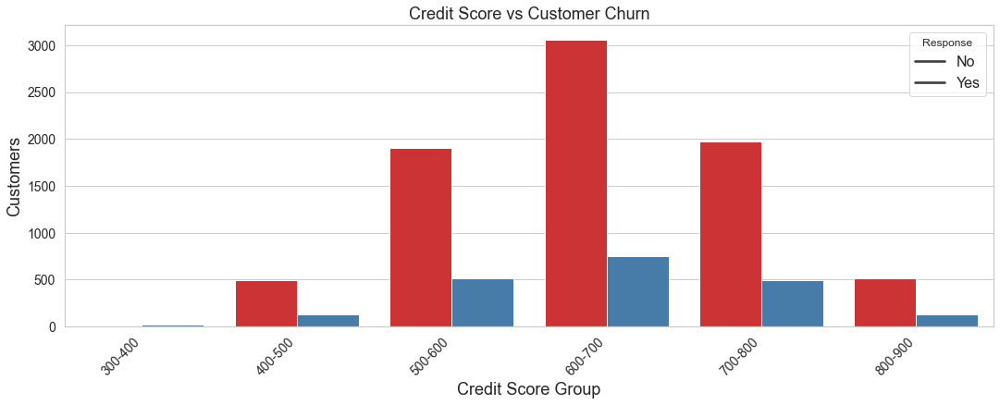

In [21]:
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
#Create a bar plot using Seaborn
# Crear un gráfico de barras utilizando seaborn
sns.barplot(x="Credit_Score Group", y='Number of Customers', data=No_of_customers_CreditScore_Exited, hue='Exited')

plt.xlabel("Credit Score Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("Credit Score vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()


In [22]:
#Corroboramos que se hallan incluido todos los clientes
No_of_customers_CreditScore_Exited['Number of Customers'].sum()

10000

In [23]:
#We verify that all customers have been included.
#Nuestro dataset no se ha modificado
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction Score,Card Type,Point Earned
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1,2,DIAMOND,464
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,3,DIAMOND,456
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,3,DIAMOND,377
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0,5,GOLD,350
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,5,GOLD,425


In [24]:
No_of_customers_CreditScore_Exited['Number of Customers'].sum()

10000

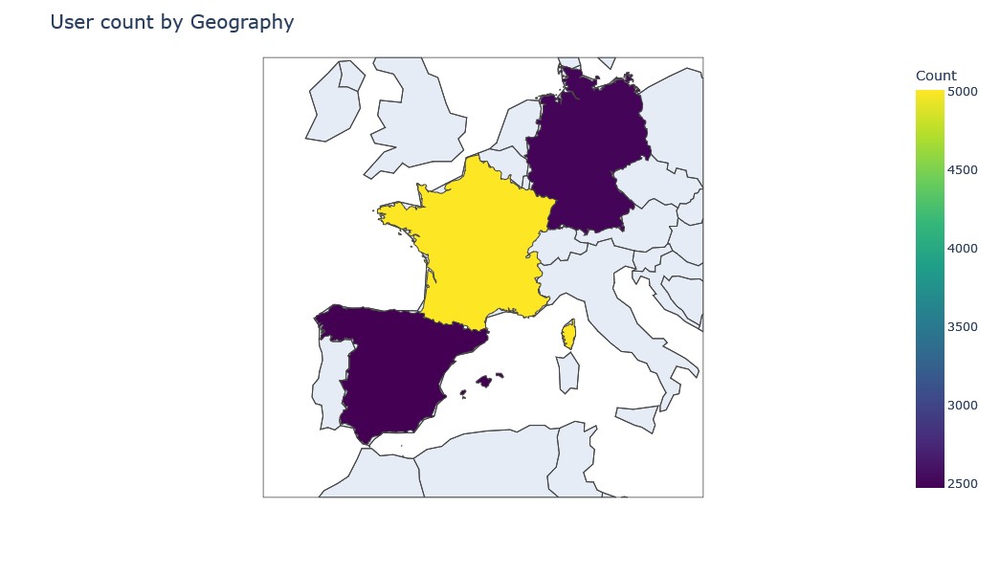

In [25]:
#Geography

import requests
import plotly.express as px

repo_url = 'https://raw.githubusercontent.com/leakyMirror/map-of-europe/master/GeoJSON/europe.geojson'
europe_geo = requests.get(repo_url).json()

country_count = df['Geography'].value_counts()
count_df = pd.DataFrame({
    'Countries': country_count.index,
    'Count': country_count.values
})

fig = px.choropleth(data_frame=count_df,
                    geojson=europe_geo,
                    locations='Countries',
                    featureidkey='properties.NAME',
                    color='Count',
                    color_continuous_scale='viridis',
                    projection="mercator")

fig.update_geos(showcountries=True, showcoastlines=True, showland=True, fitbounds="locations")
fig.update_layout(height=600, width=800, title_text='User count by Geography', title_font_size=20)

fig.show()


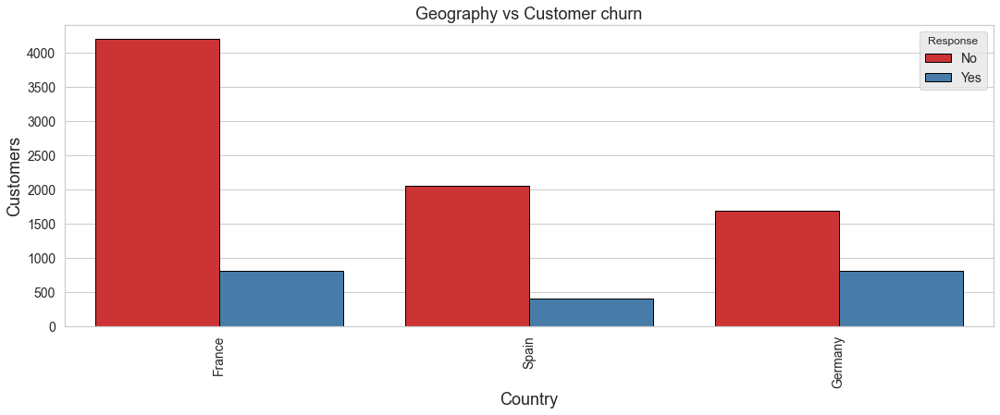

In [26]:
#For variables with few labels, we can visualize directly.
#Para variables con pocas etiquetas podemos visualizar directamente
#Geography
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="Geography", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Country",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Geography vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

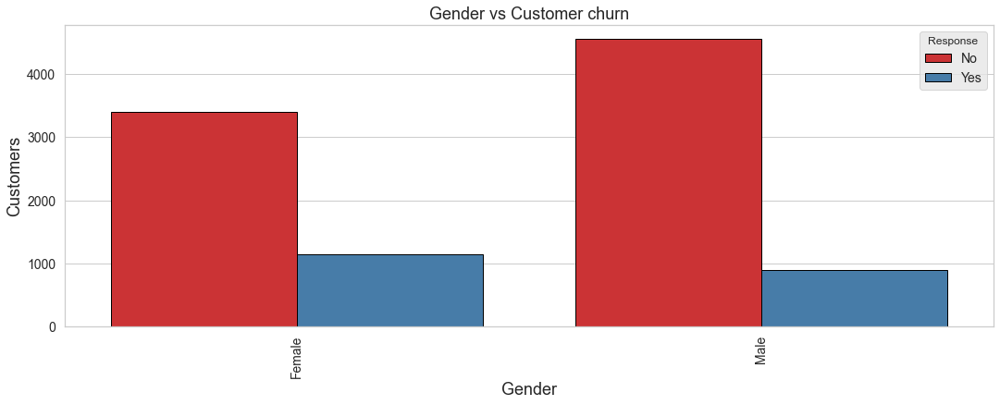

In [27]:
#Gender
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="Gender", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Gender",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Gender vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [28]:
#Age
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

Age_bins = [0, 20, 40, 60, 80, 100]
Age_labels = [ '0-20', '20-40', '40-60','60-80', '80-100']

df_copy = df.copy()

df_copy['Age Group'] = pd.cut(df_copy['Age'], bins=Age_bins, labels=Age_labels)

No_of_customers_Age_Exited = df_copy.groupby(['Age Group', 'Exited']).size().reset_index(name='Number of Customers')

No_of_customers_Age_Exited


,Age Group,Exited,Number of Customers
0,0-20,0,84
1,0-20,1,5
2,20-40,0,5648
3,20-40,1,682
4,40-60,0,1881
5,40-60,1,1236
6,60-80,0,338
7,60-80,1,114
8,80-100,0,11
9,80-100,1,1


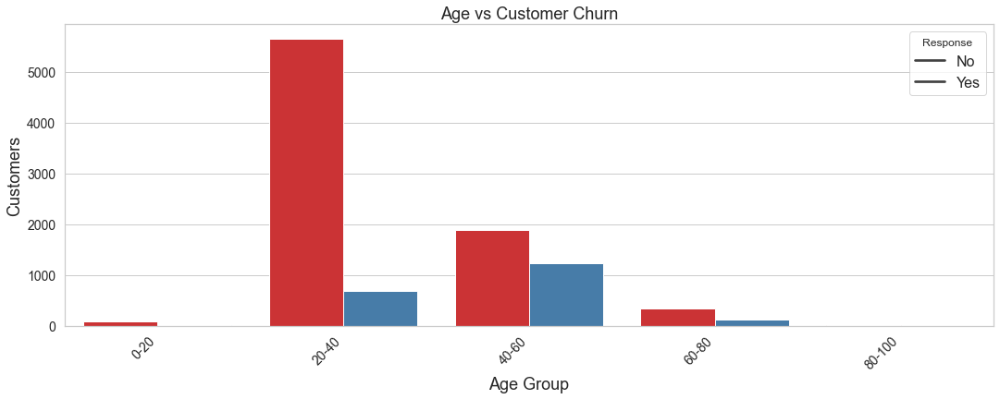

In [29]:
#Age
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.barplot(x="Age Group", y='Number of Customers', data=No_of_customers_Age_Exited, hue='Exited')

plt.xlabel("Age Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("Age vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()


In [30]:
#Tenure
Tenure_bins = [0, 2, 4, 6, 8, 10]
Tenure_labels = [ '0-2', '2-4', '4-6','6-8', '8-10']

df_copy = df.copy()
df_copy['Tenure Group'] = pd.cut(df_copy['Tenure'], bins=Tenure_bins, labels=Tenure_labels)

No_of_customers_Tenure_Exited = df_copy.groupby(['Tenure Group', 'Exited']).size().reset_index(name='Number of Customers')
No_of_customers_Tenure_Exited


,Tenure Group,Exited,Number of Customers
0,0-2,0,1650
1,0-2,1,433
2,2-4,0,1582
3,2-4,1,416
4,4-6,0,1574
5,4-6,1,405
6,6-8,0,1679
7,6-8,1,374
8,8-10,0,1159
9,8-10,1,315


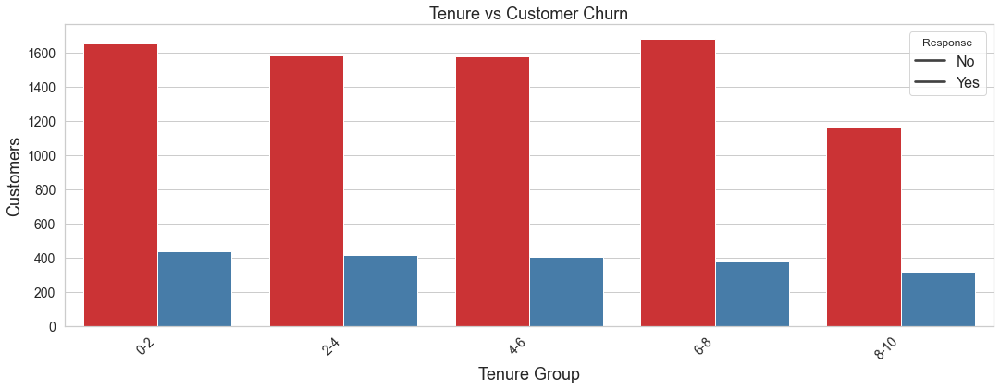

In [31]:
#Tenure
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.barplot(x="Tenure Group", y='Number of Customers', data=No_of_customers_Tenure_Exited, hue='Exited')

plt.xlabel("Tenure Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("Tenure vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()


In [32]:
#Balance
Balance_bins = [0, 50000, 100000, 150000, 200000, 250000]
Balance_labels = [ '0-50k', '50k-100k', '100k-150k','150k-200k', '200k-250k']

df_copy = df.copy()
df_copy['Balance Group'] = pd.cut(df_copy['Balance'], bins=Balance_bins, labels=Balance_labels)

No_of_customers_Balance_Exited = df_copy.groupby(['Balance Group', 'Exited']).size().reset_index(name='Number of Customers')
No_of_customers_Balance_Exited


,Balance Group,Exited,Number of Customers
0,0-50k,0,49
1,0-50k,1,26
2,50k-100k,0,1208
3,50k-100k,1,301
4,100k-150k,0,2843
5,100k-150k,1,987
6,150k-200k,0,730
7,150k-200k,1,205
8,200k-250k,0,15
9,200k-250k,1,18


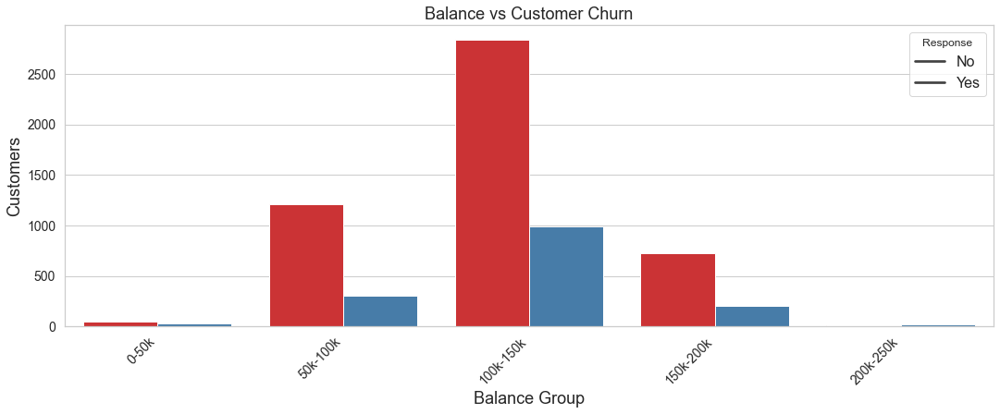

In [33]:
#Balance
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.barplot(x="Balance Group", y='Number of Customers', data=No_of_customers_Balance_Exited, hue='Exited')

plt.xlabel("Balance Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("Balance vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()


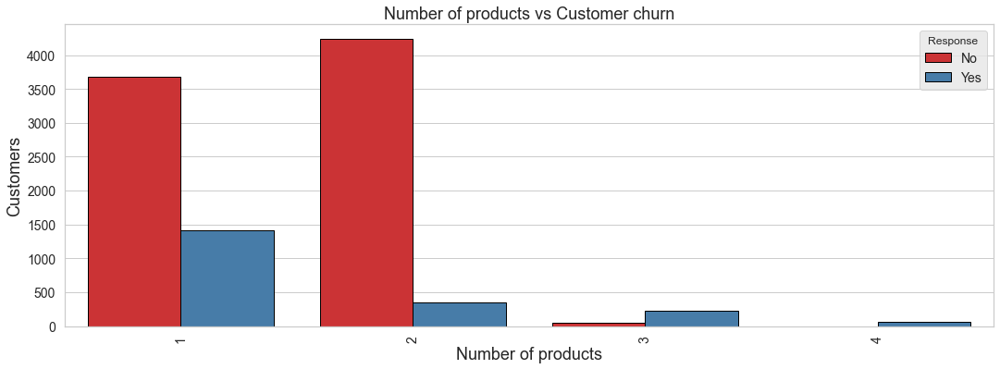

In [34]:
#Number of Products
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="NumOfProducts", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Number of products",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Number of products vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

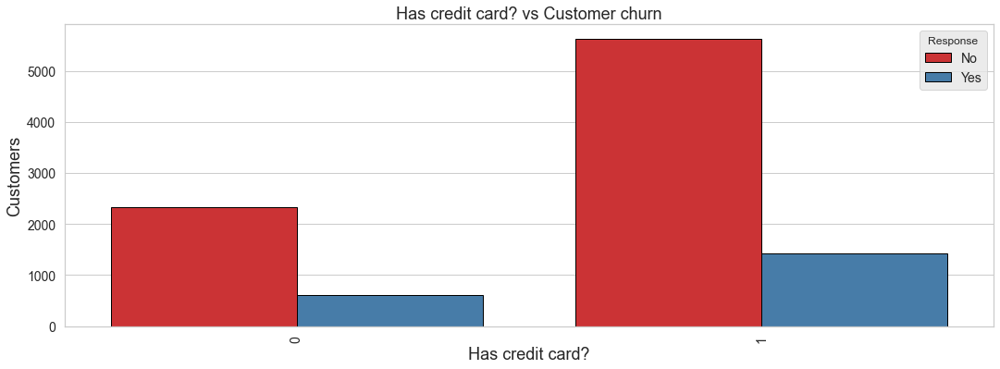

In [35]:
#Has Credit Card?
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="HasCrCard", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Has credit card?",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Has credit card? vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

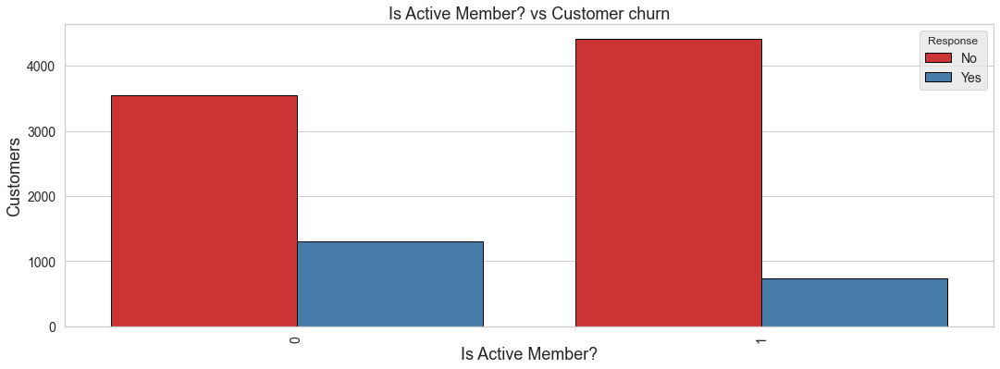

In [36]:
#Is Active member?
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="IsActiveMember", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Is Active Member?",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Is Active Member? vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [37]:
#Salary
Salary_bins = [0, 50000, 100000, 150000, 200000]
Salary_labels = [ '0-50k', '50k-100k', '100k-150k','150k-200k']

df_copy = df.copy()
df_copy['EstimatedSalary Group'] = pd.cut(df_copy['EstimatedSalary'], bins=Salary_bins, labels=Salary_labels)

No_of_customers_Salary_Exited = df_copy.groupby(['EstimatedSalary Group', 'Exited']).size().reset_index(name='Number of Customers')
No_of_customers_Salary_Exited


,EstimatedSalary Group,Exited,Number of Customers
0,0-50k,0,1964
1,0-50k,1,489
2,50k-100k,0,2033
3,50k-100k,1,504
4,100k-150k,0,2038
5,100k-150k,1,517
6,150k-200k,0,1927
7,150k-200k,1,528


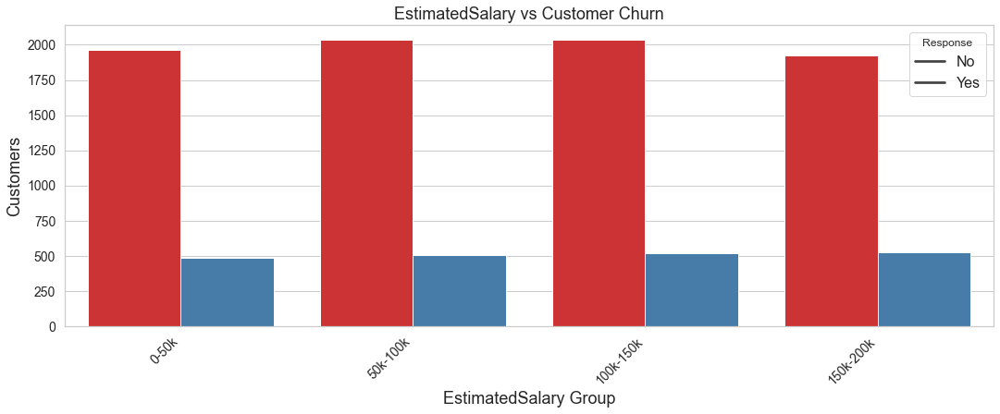

In [38]:
#Salary
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.barplot(x="EstimatedSalary Group", y='Number of Customers', data=No_of_customers_Salary_Exited, hue='Exited')

plt.xlabel("EstimatedSalary Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("EstimatedSalary vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

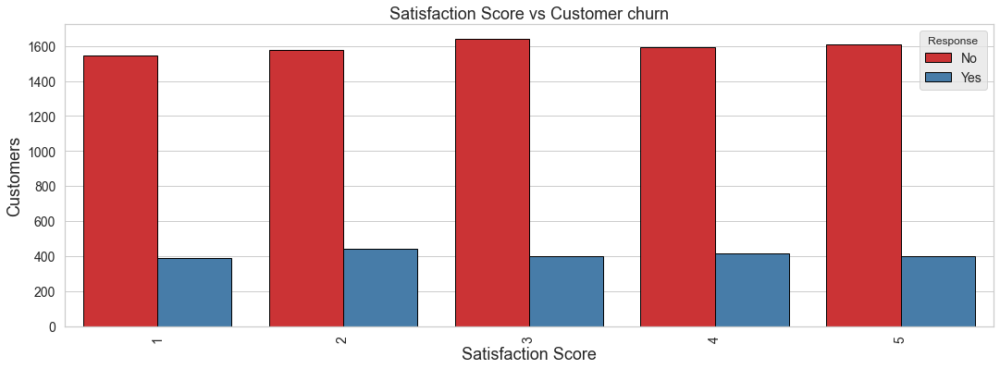

In [39]:
#Satisfaction Score
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="Satisfaction Score", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Satisfaction Score",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Satisfaction Score vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

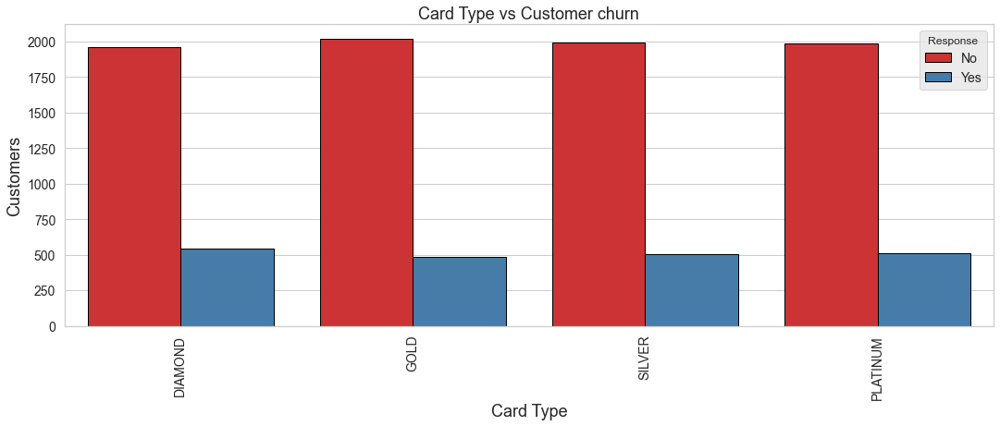

In [40]:
#Card Type
plt.figure(figsize=(18, 6))
sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.countplot(x="Card Type", data=df,hue='Exited',edgecolor='black')
plt.xlabel("Card Type",fontsize=18)
plt.ylabel("Customers",fontsize=18)
plt.title("Card Type vs Customer churn",fontsize=18)
legend = plt.legend(title="Response", labels=["No", "Yes"], fontsize=14)
legend.get_frame().set_facecolor('0.9')
legend.get_frame().set_alpha(0.8)
#plt.legend(title="Response", labels=["No", "Yes"],fontsize=16)
plt.xticks(rotation=90)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [41]:
#Point Earned
Points_bins = [0,200, 400, 600, 800, 1000]
Points_labels = ['0-200', '200-400', '400-600', '600-800','800-1000']

df_copy = df.copy()
df_copy['Points Group'] = pd.cut(df_copy['Point Earned'], bins=Points_bins, labels=Points_labels)

No_of_customers_Points_Exited = df_copy.groupby(['Points Group', 'Exited']).size().reset_index(name='Number of Customers')
No_of_customers_Points_Exited


,Points Group,Exited,Number of Customers
0,0-200,0,1
1,0-200,1,1
2,200-400,0,1860
3,200-400,1,495
4,400-600,0,2087
5,400-600,1,502
6,600-800,0,2008
7,600-800,1,545
8,800-1000,0,2006
9,800-1000,1,495


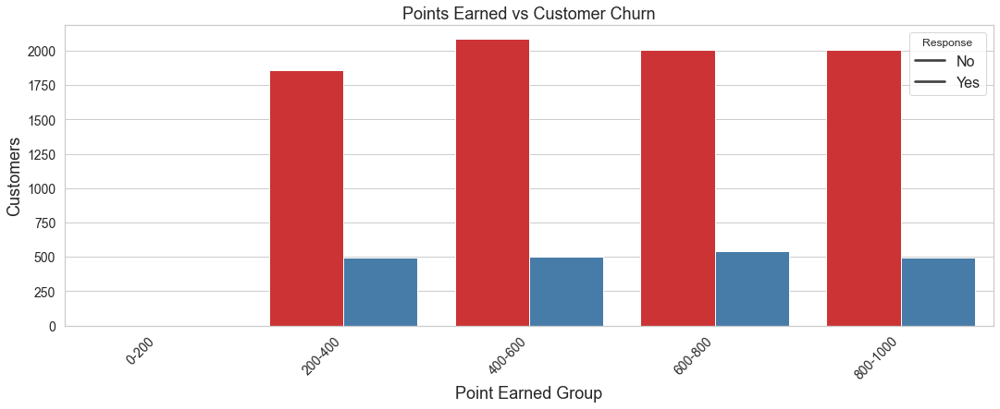

In [42]:
#Points
plt.figure(figsize=(18, 6))

sns.set(style="whitegrid")
sns.set_palette("Set1")
sns.barplot(x="Points Group", y='Number of Customers', data=No_of_customers_Points_Exited, hue='Exited')

plt.xlabel("Point Earned Group", fontsize=18)
plt.ylabel("Customers", fontsize=18)
plt.title("Points Earned vs Customer Churn", fontsize=18)
plt.legend(title="Response", labels=["No", "Yes"], fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

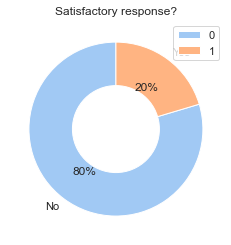

In [43]:
#It is always good in a binary classification problem to know the actual distribution of the target variable
import seaborn as sns
import matplotlib.pyplot as plt

# Data preparation
target_var = pd.crosstab(index=df['Exited'], columns='% observations')

# Set a custom color palette for the pie chart
colors = sns.color_palette('pastel')[0:len(target_var)]

# Create the pie chart
plt.pie(target_var['% observations'], labels=['No', 'Yes'], autopct='%.0f%%', colors=colors, startangle=90)

# Add a circle at the center to make it look like a donut chart
center_circle = plt.Circle((0, 0), 0.50, fc='white')
fig = plt.gcf()
fig.gca().add_artist(center_circle)

# Add a title and legend
plt.title('Satisfactory response?')
plt.legend(target_var.index, loc='upper right')

# Show the pie chart
plt.show()


In [44]:
# Apply One-Hot Encoding to convert categorical variables into numeric ones, dropping the first column created to reduce the dataset's dimensionality.
# Aplicar One-Hot Encoding para convertir las variables categóricas en variables numéricas, eliminando la primera columna creada para reducir la dimensionalidad del conjunto de datos.

df1 = pd.get_dummies(df, drop_first=True)

# Show the first rows of the transformed DataFrame df1.
# Mostrar las primeras filas del DataFrame transformado df1.

df1.head()


,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Satisfaction Score,Point Earned,Geography_Germany,Geography_Spain,Gender_Male,Card Type_GOLD,Card Type_PLATINUM,Card Type_SILVER
0,619,42,2,0.00,1,1,1,101348.88,1,2,464,0,0,0,0,0,0
1,608,41,1,83807.86,1,0,1,112542.58,0,3,456,0,1,0,0,0,0
2,502,42,8,159660.80,3,1,0,113931.57,1,3,377,0,0,0,0,0,0
3,699,39,1,0.00,2,0,0,93826.63,0,5,350,0,0,0,1,0,0
4,850,43,2,125510.82,1,1,1,79084.10,0,5,425,0,1,0,1,0,0


In [45]:
# Create our training dataset.
#Crear nuestro conjunto de entrenamiento

X=df1.drop(['Exited'],axis=1)
y=df1['Exited']

In [46]:
X.head()
X.shape

(10000, 16)

In [47]:
#Selection of the most important features to conduct the training
#Selección de las características más importantes para llevar a cabo el entrenamiento
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.feature_selection import RFE
import pandas as pd


# Establecer la semilla aleatoria para reproducibilidad
#Set the random seed for reproducibility
np.random.seed(42)

#Define a list of available models for selection
# Definir una lista de modelos disponibles para selección
available_models = {
    'ExtraTrees': ExtraTreesClassifier(n_estimators=100),
    'RandomForest': RandomForestClassifier(n_estimators=100),
    #'SVM': SVC(kernel='linear'),
    #'KNN': KNeighborsClassifier(n_neighbors=5),
    #'LASSO': Lasso(alpha=0.01),  # Agrega LASSO aquí
    #'RFE': RFE(estimator=RandomForestClassifier(n_estimators=100), n_features_to_select=10)
    # Agrega otros modelos aquí si lo deseas
}

#Choose the desired model for feature selection
# Elegir el modelo deseado para selección de características
chosen_model = 'ExtraTrees'  # Cambia esto según el modelo que quieras usar

#Create the selected model
# Crear el modelo seleccionado
clf = available_models[chosen_model]

#Train the model with the data
# Entrenar el modelo con los datos
clf = clf.fit(X.values, y)

#Obtain feature importances from the model
# Obtener importancias de características del modelo
feature_importances = clf.feature_importances_

#Create a SelectFromModel object with the trained classifier
# Crear un objeto SelectFromModel con el clasificador entrenado
model = SelectFromModel(clf, prefit=True)

#Transform the original features to obtain the selected ones
# Transformar las características originales para obtener las seleccionadas
X_new = model.transform(X.values)

# Obtener los índices de las características seleccionadas
selected_feature_indices = model.get_support(indices=True)

#Get the indices of the selected features
# Obtener los nombres de las columnas seleccionadas
selected_columns = X.columns[selected_feature_indices]
#Print the selected columns
# Imprimir las columnas seleccionadas
print("Selected columns:")
print(selected_columns)


Selected columns:
Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts',
       'EstimatedSalary', 'Satisfaction Score', 'Point Earned'],
      dtype='object')


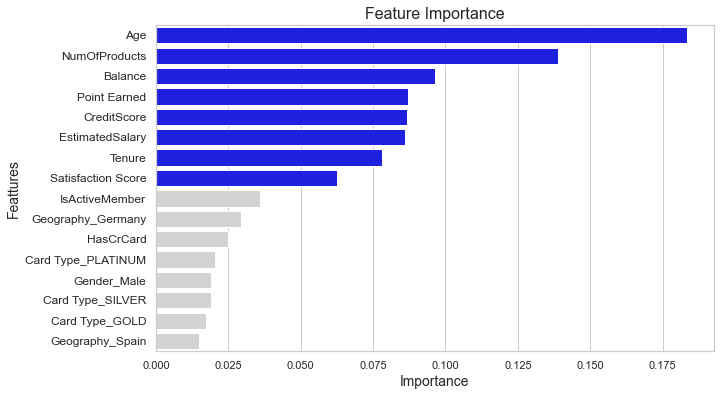

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

#Get the indices of all columns in descending order of importance
# Obtener los índices de todas las columnas en orden descendente de importancia
sorted_indices = feature_importances.argsort()[::-1]

#Get the names of all columns in the same order
# Obtener los nombres de todas las columnas en el mismo orden
sorted_columns = X.columns[sorted_indices]

#Get the sorted importances
# Obtener las importancias ordenadas
sorted_importances = feature_importances[sorted_indices]

plt.figure(figsize=(10, 6))

#Create a bar chart to display the importance of all columns in descending order
# Crear un gráfico de barras para mostrar la importancia de todas las columnas en orden descendente
sns.barplot(x=sorted_importances, y=sorted_columns, palette=['lightgrey' if i not in selected_feature_indices else 'blue' for i in sorted_indices])

plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feattures", fontsize=14)
plt.title("Feature Importance", fontsize=16)
plt.yticks(rotation=0, fontsize=12)
plt.show()


In [49]:
X_new.shape

(10000, 8)

In [50]:
#As we can see, now we only have 8 significant columns to carry out the training.
#Como podemos ver ahora solo tenemos 8 columnas significativas para llevar a cabo el entrenamiento 

In [51]:
#Model Training
#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
# Split the data into training and test sets
X_train,X_test,y_train,y_test=train_test_split(X_new,y,test_size=0.25,stratify=y,random_state=0)

#stratify=y: It is used to ensure that the distribution of classes in the training and test sets is similar to the original distribution 
#of the target variable y. This is particularly useful when dealing with umbalanced classes, as it ensures that both parts of the split have
#a similar proportion of each class.

#stratify=y: Se utiliza para garantizar
#que la distribución de las clases en el conjunto de entrenamiento y prueba sea similar a la distribución original de la variable objetivo y.
#Esto es especialmente útil cuando tienes clases desequilibradas, ya que asegura que ambas partes de la división tengan una proporción similar
#de cada clase.



In [52]:
#Verifying the size of the training and testing sets
#verificamos el tamaño de los set de entrenamiento y testeo
print("Training X size: ", X_train.shape)
print("Training y size: ", y_train.shape)
print("Test X size: ", X_test.shape)
print("Test y size: ", y_test.shape)

Training X size:  (7500, 8)
Training y size:  (7500,)
Test X size:  (2500, 8)
Test y size:  (2500,)


C:\Users\cf\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



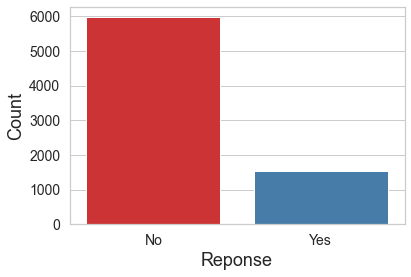

In [53]:
#Checking the distribution of the target variable
#Checamos la distribución de la variable objetivo
sns.countplot(y_train)
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
plt.xlabel('Reponse',fontsize=18)
plt.ylabel('Count',fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [54]:
#SMOTE(Synthetic Minority Oversampling Technique)
#SMOTE is a technique for oversampling the minority class. Simply adding duplicate records of the minority class often does not add new
#information to the model. In SMOTE, new instances are generated from the existing data. To put it simply, SMOTE examines instances of 
#the minority class and uses the k-nearest neighbors method to select a randomly close neighbor, and a new synthetic instance is created 
#in the feature space.

#Class imbalance, where one or more classes are significantly less frequent than others, is a common challenge in machine learning.
#The presence of minority classes can cause the model to be biased towards the majority classes and have difficulty learning patterns from 
#the minority classes. This is where techniques like SMOTE (Synthetic Minority Oversampling Technique) can help by generating synthetic
#instances to balance the classes and improve the model's performance in predicting minority classes.


#SMOTE (Técnica de Sobremuestreo Sintético de la Clase Minoritaria) es una técnica para sobremuestrear la clase minoritaria. 
#Simplemente agregar registros duplicados de la clase minoritaria a menudo no agrega información nueva al modelo.
#En SMOTE, se generan nuevas instancias a partir de los datos existentes. Si lo explicamos en palabras sencillas,
#SMOTE examina las instancias de la clase minoritaria y utiliza el método de los k vecinos más cercanos para seleccionar
#un vecino cercano al azar, y se crea una nueva instancia sintética aleatoria en el espacio de características.

#El desequilibrio de clases, donde una o más clases son significativamente menos frecuentes que otras,
#es un desafío común en el aprendizaje automático. La presencia de clases minoritarias puede hacer que el
#modelo sea sesgado hacia las clases mayoritarias y que tenga dificultades para aprender patrones de las clases minoritarias.
#Es aquí donde técnicas como SMOTE (Técnica de Sobremuestreo Sintético de la Clase Minoritaria) pueden ayudar al generar instancias
#sintéticas para equilibrar las clases y mejorar el rendimiento del modelo en la predicción de clases minoritarias.


from imblearn.over_sampling import SMOTE
X_train,X_test,y_train,y_test=train_test_split(X_new,y,test_size=0.25,stratify=y,random_state=0)
sm = SMOTE(sampling_strategy='auto', random_state=42)
X_train,y_train=sm.fit_resample(X_train,y_train)


C:\Users\cf\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



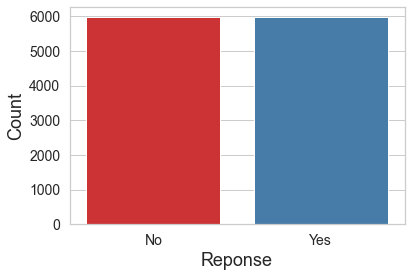

In [55]:
#Checking the new distribution of the target variable
#Checamos la nueva distribución de la variable objetivo

sns.countplot(y_train)
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])
plt.xlabel('Reponse',fontsize=18)
plt.ylabel('Count',fontsize=18)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

In [56]:
#Normalization
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [57]:
model_comparison={}


In [58]:
#Training with different models
#entrenamiento con distintos modelos
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
#Create a list of tuples with the model name and the classifier instance
# Crear una lista de tuplas con el nombre del modelo y la instancia del clasificador
models = [
    ('Logistic Regression', LogisticRegression()),
    ('Decision Tree', DecisionTreeClassifier(criterion='entropy', random_state=0)),
    ('KNN', KNeighborsClassifier(n_neighbors=5)),
    ('Naive Bayes', GaussianNB()),
    ('Random Forest', RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)),
    ('Xg Boost', XGBClassifier())
]

model_comparison = {}  #Dictionary to store the comparison metrics of models
                        # Diccionario para almacenar las métricas de comparación de modelos

for model_name, classifier in models:
    #Fit the model using the training set
    # Ajustar el modelo usando el conjunto de entrenamiento
    classifier.fit(X_train, y_train)
    #Make predictions on the test set
    # Realizar predicciones en el conjunto de prueba
    y_pred = classifier.predict(X_test)
    #Calculate model metrics
    # Calcular métricas del modelo
    accuracy = accuracy_score(y_pred, y_test)
    f1 = f1_score(y_pred, y_test, average='weighted')
    accuracies = cross_val_score(estimator=classifier, X=X_train, y=y_train, cv=5, scoring="recall")
    cv_accuracy = accuracies.mean()
    cv_std = accuracies.std()
    accuracy_class_0 = accuracy_score(y_pred[y_test == 0], y_test[y_test == 0])
    accuracy_class_1 = accuracy_score(y_pred[y_test == 1], y_test[y_test == 1])
    #Print model metrics
    # Imprimir métricas del modelo
    print(f"Modelo: {model_name}")
    print(f"Model Accuracy: {accuracy * 100:.2f}%")
    print(f"Model F1-Score: {f1 * 100:.2f}%")
    print(f"Cross Val Accuracy: {cv_accuracy * 100:.2f}%")
    print(f"Cross Val Standard Deviation: {cv_std * 100:.2f}%")
    #Add metrics to the models comparison dictionary
    # Agregar métricas al diccionario de comparación de modelos
    model_comparison[model_name] = [accuracy, accuracy_class_0, accuracy_class_1, f1, cv_accuracy, cv_std]
    print(classification_report(y_pred, y_test, zero_division=1))
    print("-" * 60)


Modelo: Logistic Regression
Model Accuracy: 70.32%
Model F1-Score: 67.91%
Cross Val Accuracy: 70.21%
Cross Val Standard Deviation: 1.85%
              precision    recall  f1-score   support

           0       0.72      0.88      0.80      1629
           1       0.63      0.37      0.46       871

    accuracy                           0.70      2500
   macro avg       0.67      0.62      0.63      2500
weighted avg       0.69      0.70      0.68      2500

------------------------------------------------------------
Modelo: Decision Tree
Model Accuracy: 76.28%
Model F1-Score: 76.14%
Cross Val Accuracy: 83.02%
Cross Val Standard Deviation: 20.61%
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1974
           1       0.43      0.42      0.43       526

    accuracy                           0.76      2500
   macro avg       0.64      0.64      0.64      2500
weighted avg       0.76      0.76      0.76      2500

----------------

In [59]:
#Ensemble methods in machine learning involve combining multiple models (often weaker models or base models) to create a stronger,
#more robust predictive model. The idea behind ensembling is that by combining the predictions of multiple models, the strengths 
#of each individual model can compensate for the weaknesses of others, leading to improved overall performance.
from sklearn.ensemble import VotingClassifier

models = [
    ('Logistic Regression', LogisticRegression()),
    ('Decision Tree', DecisionTreeClassifier(criterion='entropy', random_state=0)),
    ('KNN', KNeighborsClassifier(n_neighbors=5)),
    ('Naive Bayes', GaussianNB()),
    ('Random Forest', RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)),
    ('Xg Boost', XGBClassifier())
]

voting_classifier = VotingClassifier(estimators=models, voting='soft')  # Puedes usar 'hard' o 'soft' para el voto

voting_classifier.fit(X_train, y_train)

y_pred = voting_classifier.predict(X_test)

accuracy = accuracy_score(y_pred, y_test)
f1 = f1_score(y_pred, y_test, average='weighted')
accuracies = cross_val_score(estimator=voting_classifier, X=X_train, y=y_train, cv=5, scoring="recall")
cv_accuracy = accuracies.mean()
cv_std = accuracies.std()
accuracy_class_0 = accuracy_score(y_pred[y_test == 0], y_test[y_test == 0])
accuracy_class_1 = accuracy_score(y_pred[y_test == 1], y_test[y_test == 1])

print("Modelo: Voting Classifier")
print(f"Model Accuracy: {accuracy * 100:.2f}%")
print(f"Model F1-Score: {f1 * 100:.2f}%")
print(f"Cross Val Accuracy: {cv_accuracy * 100:.2f}%")
print(f"Cross Val Standard Deviation: {cv_std * 100:.2f}%")

model_comparison['Voting Classifier'] = [accuracy, accuracy_class_0, accuracy_class_1, f1, cv_accuracy, cv_std]
print(classification_report(y_pred, y_test, zero_division=1))
print("-" * 60)


Modelo: Voting Classifier
Model Accuracy: 80.12%
Model F1-Score: 80.17%
Cross Val Accuracy: 87.24%
Cross Val Standard Deviation: 16.94%
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1998
           1       0.50      0.51      0.51       502

    accuracy                           0.80      2500
   macro avg       0.69      0.69      0.69      2500
weighted avg       0.80      0.80      0.80      2500

------------------------------------------------------------


In [60]:
#Models Comparisson
# Comparación de modelos
for model_name, metrics in model_comparison.items():
    print(f"Modelo: {model_name}")
    print(f"Model Accuracy: {metrics[0] * 100:.2f}%")
    print(f"Model F1-Score: {metrics[3] * 100:.2f}%")
    print(f"Cross Val Accuracy: {metrics[4] * 100:.2f}%")
    print(f"Cross Val Standard Deviation: {metrics[5] * 100:.2f}%")
    print("-" * 60)

#Compare the performance of the Voting Classifier with the individual models    
# Comparar el rendimiento del Voting Classifier con los modelos individuales
voting_metrics = model_comparison['Voting Classifier']
for model_name in model_comparison:
    if model_name != 'Voting Classifier':
        individual_metrics = model_comparison[model_name]
        print(f"Comparando con {model_name}:")
        print(f"Mejora en Accuracy: {voting_metrics[0] - individual_metrics[0]:.2f}")
        print(f"Mejora en F1-Score: {voting_metrics[3] - individual_metrics[3]:.2f}")
        print("-" * 40)

Modelo: Logistic Regression
Model Accuracy: 70.32%
Model F1-Score: 67.91%
Cross Val Accuracy: 70.21%
Cross Val Standard Deviation: 1.85%
------------------------------------------------------------
Modelo: Decision Tree
Model Accuracy: 76.28%
Model F1-Score: 76.14%
Cross Val Accuracy: 83.02%
Cross Val Standard Deviation: 20.61%
------------------------------------------------------------
Modelo: KNN
Model Accuracy: 71.88%
Model F1-Score: 69.88%
Cross Val Accuracy: 86.59%
Cross Val Standard Deviation: 2.29%
------------------------------------------------------------
Modelo: Naive Bayes
Model Accuracy: 71.44%
Model F1-Score: 69.15%
Cross Val Accuracy: 74.23%
Cross Val Standard Deviation: 3.64%
------------------------------------------------------------
Modelo: Random Forest
Model Accuracy: 81.24%
Model F1-Score: 82.51%
Cross Val Accuracy: 82.22%
Cross Val Standard Deviation: 21.08%
------------------------------------------------------------
Modelo: Xg Boost
Model Accuracy: 81.32%
Mode

In [61]:
#MODEL COMPARISSON
#COMPARACIÓN DE MODELOS

Model_com_df=pd.DataFrame(model_comparison).T
Model_com_df.columns=['Model Accuracy','Model Accuracy-0','Model Accuracy-1','Model F1-Score','CV Accuracy','CV std']
Model_com_df=Model_com_df.sort_values(by='Model F1-Score',ascending=False)
Model_com_df.style.format("{:.2%}").background_gradient(cmap='magma')

,Model Accuracy,Model Accuracy-0,Model Accuracy-1,Model F1-Score,CV Accuracy,CV std
Xg Boost,81.32%,92.27%,38.51%,82.69%,81.65%,28.46%
Random Forest,81.24%,91.96%,39.29%,82.51%,82.22%,21.08%
Voting Classifier,80.12%,87.69%,50.49%,80.17%,87.24%,16.94%
Decision Tree,76.28%,84.68%,43.42%,76.14%,83.02%,20.61%
KNN,71.88%,75.14%,59.14%,69.88%,86.59%,2.29%
Naive Bayes,71.44%,73.18%,64.64%,69.15%,74.23%,3.64%
Logistic Regression,70.32%,72.28%,62.67%,67.91%,70.21%,1.85%


In [62]:
import pandas as pd

Model_com_df = pd.DataFrame(model_comparison).T
Model_com_df.columns = ['Model Accuracy', 'Model Accuracy-No', 'Model Accuracy-Yes', 'Model F1-Score', 'CV Accuracy', 'CV std']
Model_com_df = Model_com_df.sort_values(by='Model F1-Score', ascending=False)

def highlight_below_75(s):
    if s.name != 'CV std' and isinstance(s, pd.Series) and s.dtype == 'float64':
        return ['color: red' if value < 0.75 else 'color: black' for value in s]
    else:
        return ['color: black'] * len(s)

styled_df = Model_com_df.style.highlight_max(axis=0).apply(highlight_below_75, subset=pd.IndexSlice[:, :'CV Accuracy']).format("{:.2%}", subset=pd.IndexSlice[:, :'CV Accuracy'])
styled_df


,Model Accuracy,Model Accuracy-No,Model Accuracy-Yes,Model F1-Score,CV Accuracy,CV std
Xg Boost,81.32%,92.27%,38.51%,82.69%,81.65%,0.284639
Random Forest,81.24%,91.96%,39.29%,82.51%,82.22%,0.210769
Voting Classifier,80.12%,87.69%,50.49%,80.17%,87.24%,0.169446
Decision Tree,76.28%,84.68%,43.42%,76.14%,83.02%,0.206070
KNN,71.88%,75.14%,59.14%,69.88%,86.59%,0.022902
Naive Bayes,71.44%,73.18%,64.64%,69.15%,74.23%,0.036420
Logistic Regression,70.32%,72.28%,62.67%,67.91%,70.21%,0.018550


In [63]:
#As we can see, the XGBoost algorithm has the best values for Model Accuracy and F1-Score, making it a viable option to implement the model.
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

models = [
    #('Logistic Regression', LogisticRegression()),
    #('Decision Tree', DecisionTreeClassifier(criterion='entropy', random_state=0)),
    #('KNN', KNeighborsClassifier(n_neighbors=5)),
    #('Naive Bayes', GaussianNB()),
    #('Random Forest', RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)),
    ('Xg Boost', XGBClassifier())
]


for model_name, classifier in models:
    classifier.fit(X_train, y_train)
    
    y_pred = classifier.predict(X_test)
    
    accuracy = accuracy_score(y_pred, y_test)
    f1 = f1_score(y_pred, y_test, average='weighted')
    accuracies = cross_val_score(estimator=classifier, X=X_train, y=y_train, cv=5, scoring="recall")
    cv_accuracy = accuracies.mean()
    cv_std = accuracies.std()
    accuracy_class_0 = accuracy_score(y_pred[y_test == 0], y_test[y_test == 0])
    accuracy_class_1 = accuracy_score(y_pred[y_test == 1], y_test[y_test == 1])
    
    print(f"Modelo: {model_name}")
    print(f"Model Accuracy: {accuracy * 100:.2f}%")
    print(f"Model F1-Score: {f1 * 100:.2f}%")
    print(f"Cross Val Accuracy: {cv_accuracy * 100:.2f}%")
    print(f"Cross Val Standard Deviation: {cv_std * 100:.2f}%")
    

Modelo: Xg Boost
Model Accuracy: 81.32%
Model F1-Score: 82.69%
Cross Val Accuracy: 81.65%
Cross Val Standard Deviation: 28.46%


[[1837  154]
 [ 313  196]]
Normalized confusion matrix
[[0.92 0.08]
 [0.61 0.39]]


C:\Users\cf\AppData\Local\Temp\ipykernel_2764\2950363384.py:24: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



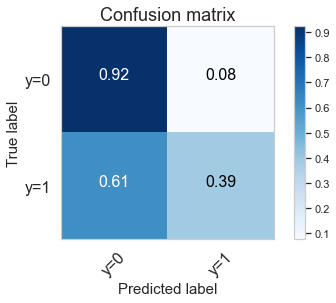

In [64]:
# Compute confusion matrix for the best model
from sklearn.metrics import classification_report, confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix. Normalization can be applied by setting normalize=True.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix without normalization')

    print(cm)

    #Plot the confusion matrix.
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.grid(False)
    plt.title(title,fontsize=18)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    # Add labels to the cells of the confusion matrix.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",fontsize=16,
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label',fontsize=15)
    plt.xlabel('Predicted label',fontsize=15)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

print(confusion_matrix(y_test, y_pred, labels=[0,1]))


cnf_matrix = confusion_matrix(y_test, y_pred, labels=[0,1])
np.set_printoptions(precision=2)

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['y=0','y=1'],normalize= True,  title='Confusion matrix')

In [65]:
#DEEP LEARNING
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, classification_report

# Scale the data with StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Build the model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Predict on the test data
y_pred_proba = model.predict(X_test)
y_pred = (y_pred_proba >= 0.5).astype(int)

# Calculate metrics
print(f"Model Accuracy: {accuracy_score(y_pred, y_test) * 100:.2f}%")
print(f"Model F1-Score: {f1_score(y_pred, y_test, average='weighted') * 100:.2f}%")
print(classification_report(y_pred, y_test, zero_division=1))

# Calculate accuracies per class
accuracy_class_0 = accuracy_score(y_pred[y_test == 0], y_test[y_test == 0])
accuracy_class_1 = accuracy_score(y_pred[y_test == 1], y_test[y_test == 1])


Epoch 1/10
374/374 [==============================] - 3s 4ms/step - loss: 0.5434 - accuracy: 0.7353
Epoch 2/10
374/374 [==============================] - 1s 3ms/step - loss: 0.4806 - accuracy: 0.7723
Epoch 3/10
374/374 [==============================] - 1s 3ms/step - loss: 0.4588 - accuracy: 0.7872
Epoch 4/10
374/374 [==============================] - 1s 3ms/step - loss: 0.4405 - accuracy: 0.7955
Epoch 5/10
374/374 [==============================] - 1s 3ms/step - loss: 0.4252 - accuracy: 0.8060
Epoch 6/10
374/374 [==============================] - 1s 4ms/step - loss: 0.4130 - accuracy: 0.8144
Epoch 7/10
374/374 [==============================] - 1s 3ms/step - loss: 0.3993 - accuracy: 0.8205
Epoch 8/10
374/374 [==============================] - 1s 3ms/step - loss: 0.3913 - accuracy: 0.8233
Epoch 9/10
374/374 [==============================] - 1s 3ms/step - loss: 0.3844 - accuracy: 0.8271
Epoch 10/10
79/79 [==============================] - 1s 4ms/step
Model Accuracy: 74.28%
Model F1-Sco

[[1518  473]
 [ 170  339]]
Normalized confusion matrix
[[0.76 0.24]
 [0.33 0.67]]


C:\Users\cf\AppData\Local\Temp\ipykernel_2764\513483293.py:24: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



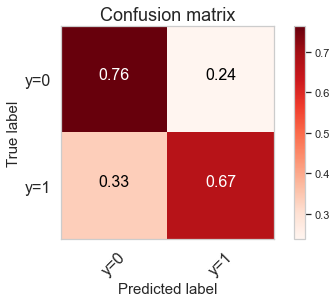

In [66]:
# Compute confusion matrix for the Deep learning model
from sklearn.metrics import classification_report, confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    """
    This function prints and plots the confusion matrix. Normalization can be applied by setting normalize=True.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix without normalization')

    print(cm)

    #Plot the confusion matrix.
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.grid(False)  # <-- Agregar esta línea para evitar el aviso de deprecación
    plt.title(title,fontsize=18)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    # Add labels to the cells of the confusion matrix.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",fontsize=16,
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label',fontsize=15)
    plt.xlabel('Predicted label',fontsize=15)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

print(confusion_matrix(y_test, y_pred, labels=[0,1]))


cnf_matrix = confusion_matrix(y_test, y_pred, labels=[0,1])
np.set_printoptions(precision=2)

# Plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['y=0','y=1'],normalize= True,  title='Confusion matrix')